# Базовая проверка YOLO на кадрах из Unigine

## 1. Установка и импорт библиотек

In [ ]:
%pip install -U ultralytics pandas

In [ ]:
from pathlib import Path

import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display
from PIL import Image
from ultralytics import YOLO

## 2. Проверка одного изображения

Тестовое изображение: c:\Users\Asus\Documents\UNIGINE Projects\unigine_project\git_project\SummerPractice2026\cv_model\test_images\1.jpg


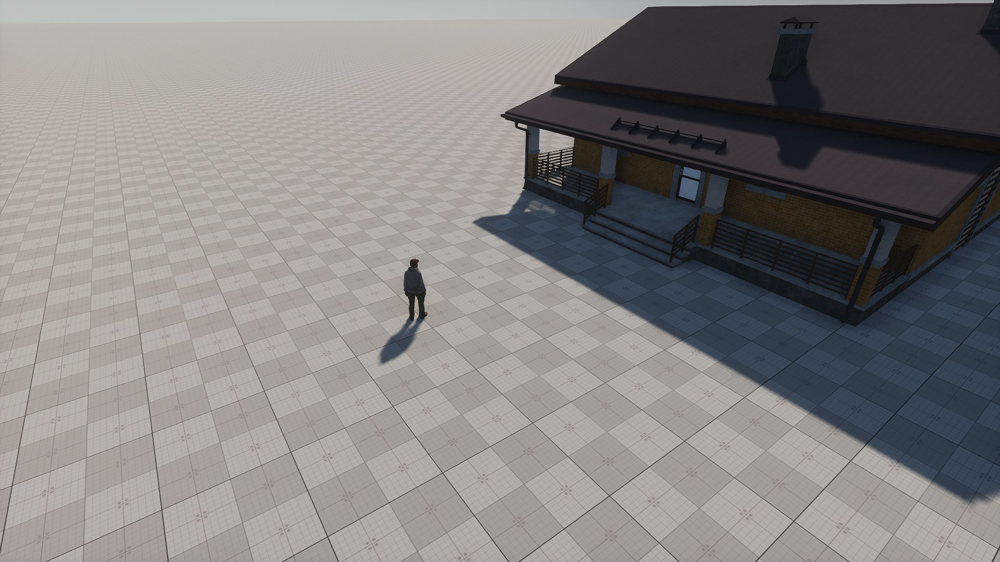

In [ ]:
# Path.cwd() должен указывать на папку cv_model,
# потому что ноутбук yolo_first.ipynb находится именно там.
project_dir = Path.cwd()

image_path = project_dir / "test_images" / "1.jpg"

if not image_path.exists():
    raise FileNotFoundError(
        f"Изображение не найдено: {image_path}\n"
        "Проверь имя файла, расширение и папку test_images."
    )

print(f"Тестовое изображение: {image_path}")
display(Image.open(image_path))

In [ ]:
# Загружаем лёгкую предобученную модель.
# При первом запуске файл весов скачается автоматически.
model = YOLO("yolo11n.pt")

# Ищем только человека: класс 0 в датасете COCO.
results = model.predict(
    source=str(image_path),
    classes=[0],
    conf=0.25,
    save=False,
    verbose=True
)

print("Детекция завершена")


image 1/1 c:\Users\Asus\Documents\UNIGINE Projects\unigine_project\git_project\SummerPractice2026\cv_model\test_images\1.jpg: 384x640 1 person, 101.9ms
Speed: 3.6ms preprocess, 101.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
Детекция завершена


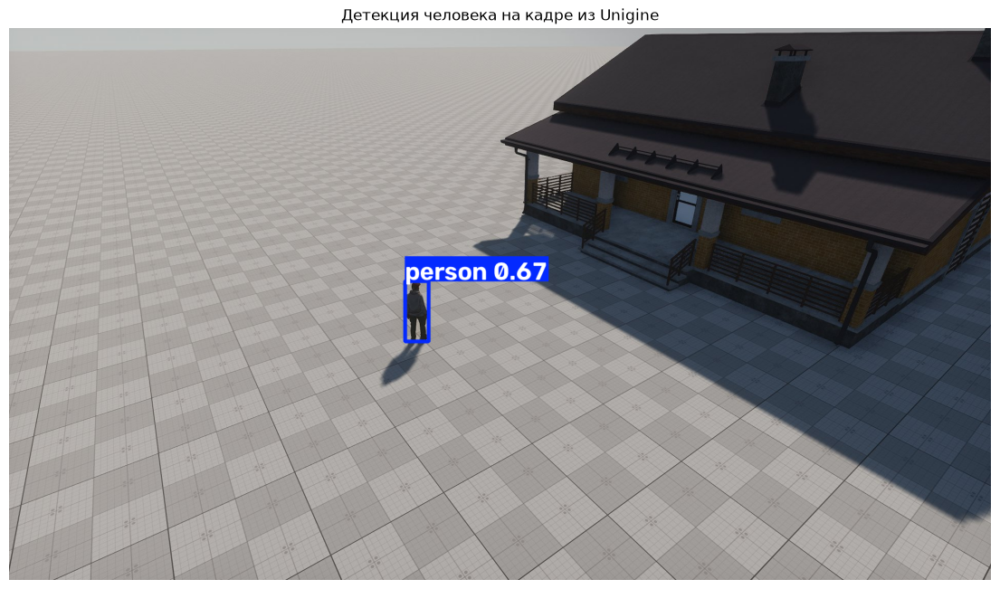

In [ ]:
result = results[0]

annotated_bgr = result.plot()
annotated_rgb = annotated_bgr[:, :, ::-1]

plt.figure(figsize=(14, 9))
plt.imshow(annotated_rgb)
plt.axis("off")
plt.title("Детекция человека на кадре из Unigine")
plt.show()

## 3. Проверка набора изображений (7шт)

In [ ]:
# Папки проекта
project_dir = Path.cwd()
images_dir = project_dir / "test_images"
results_dir = project_dir / "results"
results_dir.mkdir(parents=True, exist_ok=True)

# Находим все изображения
image_paths = sorted(
    path
    for path in images_dir.iterdir()
    if path.suffix.lower() in {".jpg", ".jpeg", ".png"}
)

if not image_paths:
    raise FileNotFoundError("В папке test_images нет изображений.")

summary = []

for image_path in image_paths:
    # Ищем только людей: класс person имеет номер 0
    result = model.predict(
        source=str(image_path),
        classes=[0],
        conf=0.25,
        verbose=False
    )[0]

    boxes = result.boxes
    people_count = len(boxes) if boxes is not None else 0

    # Наибольшая уверенность среди найденных людей
    if people_count > 0:
        max_confidence = float(boxes.conf.max().cpu())
    else:
        max_confidence = 0.0

    # Сохраняем изображение с рамками
    annotated_bgr = result.plot()
    annotated_rgb = annotated_bgr[:, :, ::-1]

    output_path = results_dir / f"{image_path.stem}_detected.jpg"
    Image.fromarray(annotated_rgb).save(output_path)

    summary.append({
        "Изображение": image_path.name,
        "Найдено людей": people_count,
        "Максимальная уверенность": round(max_confidence, 3),
        "Результат": output_path.name
    })

# Создаём и сохраняем таблицу
summary_df = pd.DataFrame(summary)
summary_df.to_csv(
    results_dir / "detection_summary.csv",
    index=False,
    encoding="utf-8-sig"
)

display(summary_df)

print(f"\nОбработано изображений: {len(image_paths)}")
print(f"Результаты сохранены в: {results_dir.resolve()}")

,Изображение,Найдено людей,Максимальная уверенность,Результат
0,1.jpg,1,0.673,1_detected.jpg
1,2.jpg,1,0.844,2_detected.jpg
2,3.jpg,1,0.760,3_detected.jpg
3,4.jpg,0,0.000,4_detected.jpg
4,5.jpg,1,0.825,5_detected.jpg
5,legs.jpg,1,0.353,legs_detected.jpg
6,without.jpg,0,0.000,without_detected.jpg



Обработано изображений: 7
Результаты сохранены в: C:\Users\Asus\Documents\UNIGINE Projects\unigine_project\git_project\SummerPractice2026\cv_model\results


1_detected.jpg


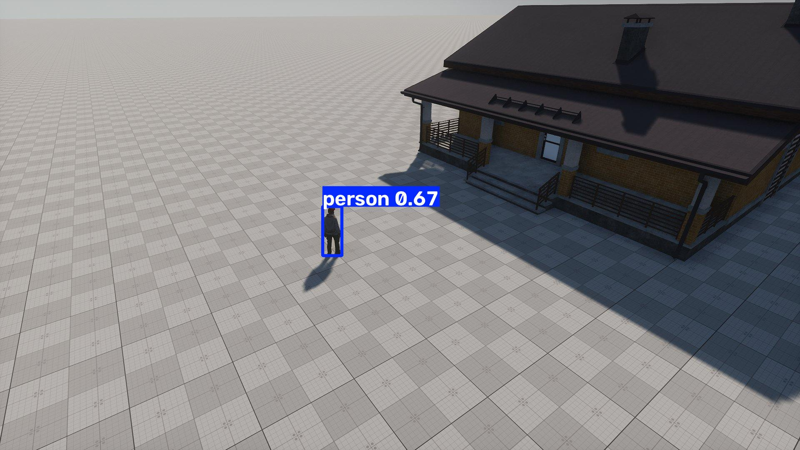

2_detected.jpg


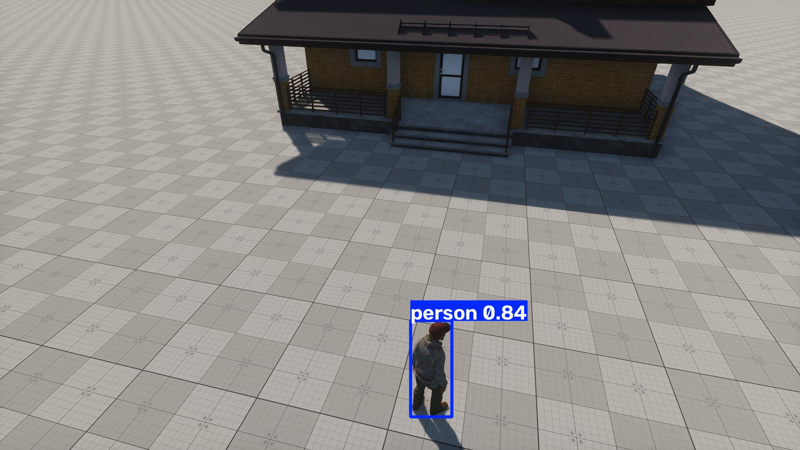

3_detected.jpg


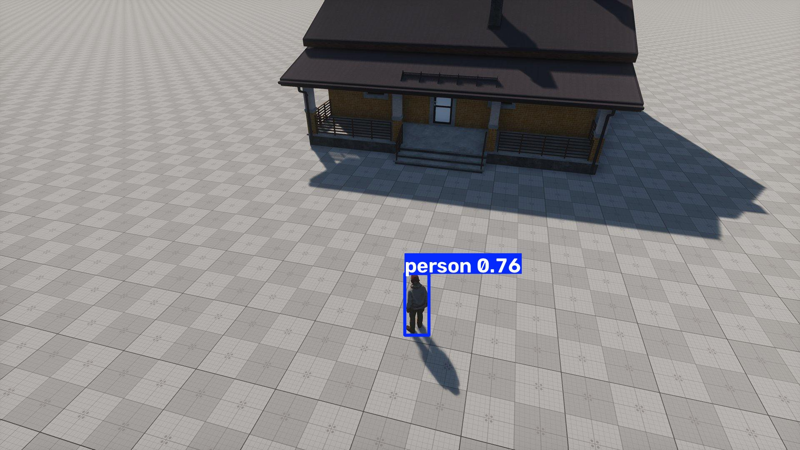

4_detected.jpg


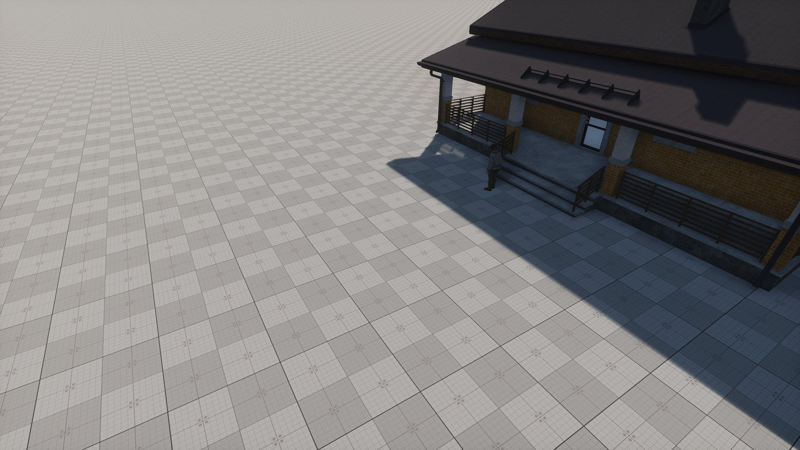

5_detected.jpg


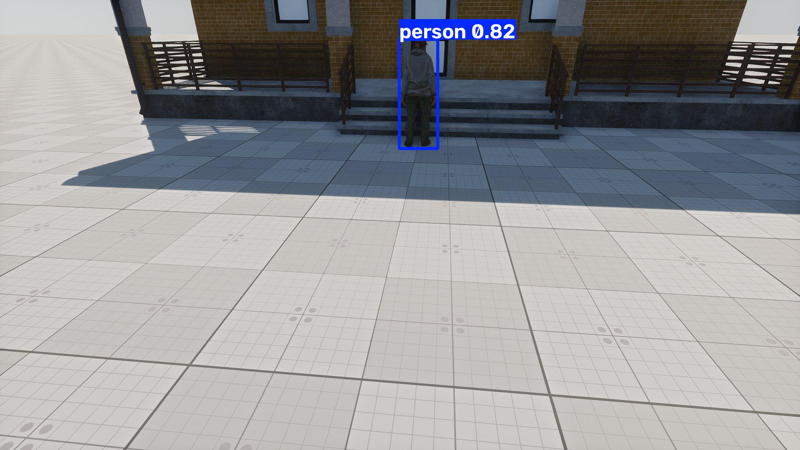

legs_detected.jpg


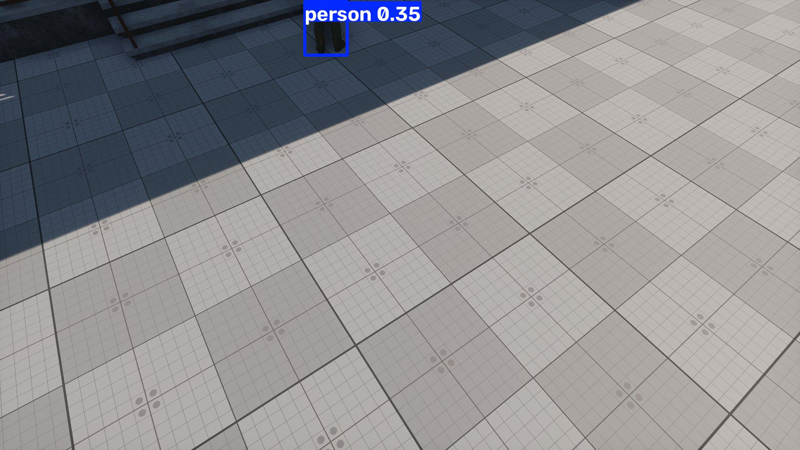

without_detected.jpg


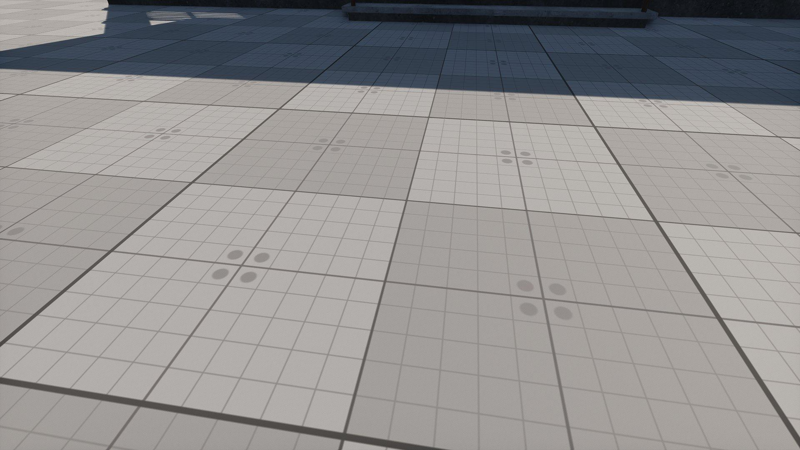

In [10]:
for result_path in sorted(results_dir.glob("*_detected.jpg")):
    print(result_path.name)
    display(Image.open(result_path).resize((800, 450)))

## Выводы по первому тесту

Предобученная модель YOLO11n была протестирована на 7 изображениях из сцены Unigine.

Результаты:

- на 5 изображениях человек обнаружен корректно;
- на изображении `legs.jpg` модель обнаружила частично видимого человека с уверенностью 0.353;
- на изображении `without.jpg` ложных срабатываний не было;
- на изображении `4.jpg` человек не был обнаружен из-за слабого освещения и низкого контраста.

Предварительный вывод: модель YOLO11n подходит для базового прототипа, но требуется дополнительное тестирование в условиях плохого освещения.